#                                 US Temperature Analysis

Various articles that has been written about "**USA** Temperature trends" claim that the average surface temperature across the contiguous 48 states has risen at an average rate of 0.14°F per decade . and also claims that average temperature has risen quickly since 1970's.Other advances claim that the average temperature has increased annualy about 1.3°F to 1.9°F since 1895.

Our Data has timeseries climatic data relevant to USA states recorded from 1995.Some of the important points that should be taken under consideration while proceeding with this analysis are listed below

* 8 out of 10 warmest years has been recorded since 1998.
* 2012 and 2015 were two warmest years on record.
* 2012 was the warmest year recorded worldwide.
* 2006-2015 was the warmest decade on record worldwide.
* The North,West and Alaska have seen most temperature increase
* South east has experienced a little change

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#import plotly.express as px


In [180]:
#! pip install chart_studio
import chart_studio.tools as tls
tls.set_credentials_file(username='akilabalasundaram', api_key='xB1EAUo6iIVbUcoqFkQa')
import chart_studio.plotly as py

In [2]:
from plotly.offline import init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import plotly.tools as tls
import plotly.graph_objs as go

## Preparing the Data

We have temperature data for various parts of the world but we are very much interested in USA temperature trends so we have to extract data for USA alone into a Dataframe and proceed with further analysis. Here i have divided Data into 3 DF's 
 * one to hold whole of USA time series data from 1995 to 2020.
 * one to have the mean of average temperatues(from 1995 to 2020) statewise (this is not a timeseries data).
 * one to have the Maximum  average temperatues(from 1995 to 2020) statewise (this is not a timeseries data).
 

In [3]:
temp=pd.read_csv("city_temperature.csv",index_col=False)

c:\users\nmayavan.ead\opencv\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning:

Columns (2) have mixed types.Specify dtype option on import or set low_memory=False.



In [4]:
temp.head(2)

,Region,Country,State,City,Month,Day,Year,AvgTemperature
0,Africa,Algeria,NaN,Algiers,1,1,1995,64.2
1,Africa,Algeria,NaN,Algiers,1,2,1995,49.4


In [5]:
USA=temp[temp['Country']=='US']

In [154]:
USA.head()

,Region,Country,State,City,Month,Day,Year,AvgTemperature
1450990,North America,US,Alabama,Birmingham,1,1,1995,50.7
1450991,North America,US,Alabama,Birmingham,1,2,1995,37.2
1450992,North America,US,Alabama,Birmingham,1,3,1995,33.2
1450993,North America,US,Alabama,Birmingham,1,4,1995,33.3
1450994,North America,US,Alabama,Birmingham,1,5,1995,26.4


In [7]:
USA_grp=pd.DataFrame(USA.groupby('State')['AvgTemperature'].mean())

In [8]:
USA_grp.head()

,AvgTemperature
State,
Additional Territories,61.441049
Alabama,64.106020
Alaska,36.034362
Arizona,67.589949
Arkansas,62.025192


In [9]:
USA_grp=USA_grp.reset_index()

In [10]:
abb=pd.read_excel("US_States.xlsx")
#abb

In [11]:
USA_grp=USA_grp.merge(abb,left_on='State',right_on='US State:',how='outer')
USA_grp.dropna(axis=0,inplace=True)
USA_grp.drop("US State:",axis=1,inplace=True)
USA_grp.rename(columns={"Abbreviation:":"Code"},inplace=True)

In [12]:
USA_grp.head(5)

,State,AvgTemperature,Code
1,Alabama,64.106020,AL
2,Alaska,36.034362,AK
3,Arizona,67.589949,AZ
4,Arkansas,62.025192,AR
5,California,61.572665,CA


 ### Lets check the assertion of northern,western parts of USA expereincing more change while southeastern experience less  change in temperature
 
 For this analysis we are going to compare the states  from all categories.
 
 * **North Western Part of USA**
         1)Illinois
         2)Missouri
         3)Kansas
         4)South Dakota
 * **South Eastern Part of USA**
         1)Georgia
         2)Florida
         3)Alabama
 * **Special Case**
         1)Alaska

In [182]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json') as response:
    States = json.load(response)



import plotly.express as px

fig = px.choropleth_mapbox(USA_grp, geojson=States, locations='State',featureidkey="properties.name", color='AvgTemperature',
                           color_continuous_scale="temps",
                           range_color=(20,80),
                           mapbox_style="carto-positron",
                           center = {"lat": 37.0902, "lon": -95.7129},
                           zoom=3, 
                           opacity=1,
                           labels={'AvgTemperature':'Average temperature'},
                           title="Average temperature recorded Statewise"
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
#fig.show()
py.iplot(fig, filename='Averagetemp')

In [14]:
USA_max=pd.DataFrame(USA.groupby('State')['AvgTemperature'].max())

In [15]:
USA_max=USA_max.reset_index()
USA_max.sort_values('AvgTemperature',ascending=False)
USA_max.head(2)

,State,AvgTemperature
0,Additional Territories,89.2
1,Alabama,91.5


In [16]:
USA_max['State'].unique()

array(['Additional Territories', 'Alabama', 'Alaska', 'Arizona',
       'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware',
       'District of Columbia', 'Florida', 'Georgia', 'Hawaii', 'Idaho',
       'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana',
       'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota',
       'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
       'New Hampshire', 'New Jersey', 'New Mexico', 'New York',
       'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon',
       'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota',
       'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington',
       'West Virginia', 'Wisconsin', 'Wyoming'], dtype=object)

In [183]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json') as response:
    States = json.load(response)



import plotly.express as px

fig = px.choropleth_mapbox(USA_max, geojson=States, locations='State',featureidkey="properties.name", color='AvgTemperature',
                            color_continuous_scale="temps",
                           range_color=(60,110),
                           mapbox_style="carto-positron",
                           center = {"lat": 37.0902, "lon": -95.7129},
                           zoom=3, 
                           opacity=1,
                           labels={'AvgTemperature':'Maximum temperature'},
                           title="Maximum temperature recorded Statewise"
                          )

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
py.iplot(fig,filename="maximum temp")

In [18]:
states_analysis=['Alabama','Alaska','Illinois','Missouri','South Dakota','Kansas','Georgia','Florida']
analysis_states=pd.DataFrame()
#for s in states_analysis:
    #l=pd.Dataframe(USA_grp[USA_grp['State']=s])
    #analysis_states=analysis_states.append(USA_grp['State']=s)
    #print(s)
analysis_states=USA_grp[USA_grp['State'].isin(states_analysis)]
analysis_states=analysis_states.reset_index()
analysis_states.drop('index',axis=1,inplace=True)
analysis_states.head(1)

,State,AvgTemperature,Code
0,Alabama,64.10602,AL


In [19]:
analysis_states1=USA_max[USA_max['State'].isin(states_analysis)]
analysis_states1=analysis_states1.reset_index()
analysis_states1.drop('index',axis=1,inplace=True)
analysis_states1.rename(columns={'AvgTemperature':'Max Temp'},inplace=True)
analysis_states1.head(1)

,State,Max Temp
0,Alabama,91.5


In [21]:
analysis_states=analysis_states.merge(analysis_states1,left_on='State',right_on='State',how='outer')
analysis_states['difference']=analysis_states['Max Temp']-analysis_states['AvgTemperature']
analysis_states=analysis_states.set_index('State')

In [23]:
#analysis_states['State'].unique()

<Figure size 1080x1080 with 0 Axes>

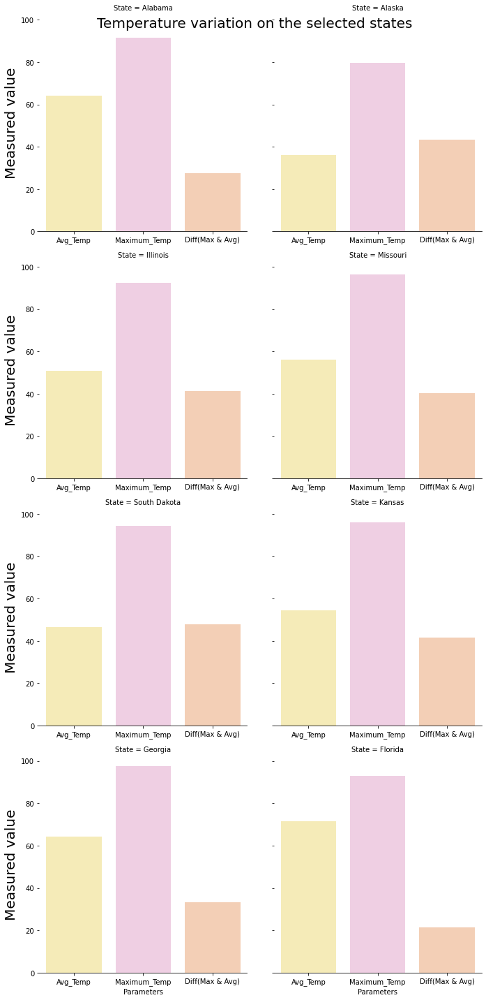

In [117]:
j=pd.DataFrame()
fig=plt.figure(figsize=(15,15))
df_merge=pd.DataFrame()
plt.suptitle("Temperature variation on the selected states")

for i in range(1,9):
    j=analysis_states.loc[[states_analysis[i-1]]]
    l=[j.at[states_analysis[i-1],'AvgTemperature'],j.at[states_analysis[i-1],'Max Temp'],j.at[states_analysis[i-1],'difference']]
    dict={'State':[states_analysis[i-1],states_analysis[i-1],states_analysis[i-1]],
          'Parameters':['Avg_Temperature','Maximum_Temperature','Difference between Max & Avg'],
          'Measurements':l}
    df=pd.DataFrame(data=dict)
    df_merge=pd.concat([df_merge,df],axis=0)
i=i+1
g=sns.catplot(x="Parameters",y="Measurements",col="State",col_wrap=2,data=df_merge,kind='bar',legend=True,legend_out=True,palette='Pastel2_r',sharex=False)
g.fig.suptitle("Temperature variation on the selected states",fontsize=20)
g.set_xticklabels(['Avg_Temp','Maximum_Temp','Diff(Max & Avg)'], fontsize=8)
g.set_ylabels('Measured value', fontsize= 20)
g.set_xticklabels(fontsize=10)
g.despine(left=True)

In [25]:
analysis_states['Classification']=['South East','Special State (Alaska)','South East','South East','North & West','North & West','North & West','North & West']
analysis_states

,AvgTemperature,Code,Max Temp,difference,Classification
State,,,,,
Alabama,64.106020,AL,91.5,27.393980,South East
Alaska,36.034362,AK,79.5,43.465638,Special State (Alaska)
Florida,71.562343,FL,92.8,21.237657,South East
Georgia,64.268373,GA,97.7,33.431627,South East
Illinois,50.937094,IL,92.3,41.362906,North & West
Kansas,54.445012,KS,96.1,41.654988,North & West
Missouri,56.058399,MO,96.3,40.241601,North & West
South Dakota,46.511414,SD,94.3,47.788586,North & West


In [26]:
analysis_regionwise=analysis_states.groupby('Classification')['difference'].mean()
analysis_regionwise=pd.DataFrame(analysis_regionwise)
analysis_regionwise

,difference
Classification,
North & West,42.762020
South East,27.354421
Special State (Alaska),43.465638


In [27]:
Region_values=analysis_regionwise['difference'].to_list()
Region_labels=analysis_regionwise.index.to_list()

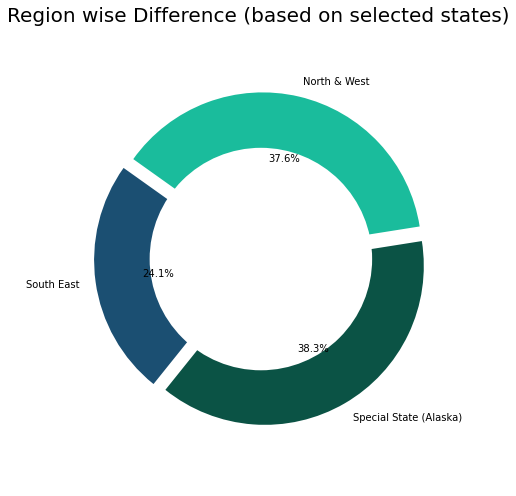

In [186]:
color=['#1ABC9C','#1B4F72','#0B5345']
explode=[]
for i in Region_labels:
    explode.append(0.05)
    
plt.figure(figsize= (7,7))
plt.pie(Region_values, labels=Region_labels, autopct='%1.1f%%', startangle=9, explode =explode,colors = color)
centre_circle = plt.Circle((0,0),0.70,fc='white')
#centre_circle = plt.Rectangle((0,0),0.70,fc='white')

fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.title('Region wise Difference (based on selected states)',fontsize = 20)
plt.axis('equal')  
plt.tight_layout()

In [29]:
USA_timeframe=pd.DataFrame(USA.groupby(['State','Year'])['AvgTemperature'].mean())

In [30]:
USA_timeframe=USA_timeframe.reset_index()
USA_timeframe.head(2)
#USA_timeframe['Year'].unique()

,State,Year,AvgTemperature
0,Additional Territories,1995,80.619452
1,Additional Territories,1996,4.661475


In [31]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json') as response:
    States = json.load(response)


In [32]:
px.choropleth(USA_timeframe,geojson=States,locations="State",featureidkey="properties.name", color="AvgTemperature", hover_name="State", animation_frame="Year",range_color=(20,90),
              color_continuous_scale='icefire', projection='albers usa',title="Statewise Avg temperature based on year",labels={'AvgTemperature':'Avg temperature recorded<br> in F '})

In [ ]:
#USA.corr()[['AvgTemperature']].sort_values('AvgTemperature')

## 2012 and 2015 were two warmest years on record

Lets check the second allegation that states that 2012 and 2015 where the warmest years that has been recorded. For this we are going to take a seperate dataframe that will hold datas of years 2012 to 2015 (ignoring the dates).

In [33]:
warmest=[2010,2011,2012,2013,2014,2015,2016,2017]
USA_2012_15=USA_timeframe[USA_timeframe['Year'].isin(warmest)]
USA_2012_15

,State,Year,AvgTemperature
15,Additional Territories,2010,78.467397
16,Additional Territories,2011,76.537534
17,Additional Territories,2012,80.362295
18,Additional Territories,2013,79.548585
34,Alabama,2010,63.496575
...,...,...,...
1327,Wyoming,2013,45.596712
1328,Wyoming,2014,45.826438
1329,Wyoming,2015,47.870822
1330,Wyoming,2016,47.773770


In [188]:
px.choropleth(USA_2012_15,geojson=States,locations="State",featureidkey="properties.name", color="AvgTemperature", hover_name="State", animation_frame="Year",range_color=(40,85),
              color_continuous_scale='twilight', projection='albers usa',title="Statewise Avg temperature(2010 - 2017)",labels={'AvgTemperature':'Avg temperature recorded<br> in F '})


## 2006-2015 was the warmest decade on record worldwide.

Lets see wheather this allegation applies to USA data also . We have data from 1995 to 2020 but we will take the data till 2019 since 2020 is still on going year. so lets divide this year into ranges of decades
* 1995-2005( I am adding a year to this since i want to specifically check for 2006 -2015)
* 2006-2015
* 2016-2019(decade Incomplete)

So officially we can ignore the years (2016-2019) though it is still a ongoing decade but i am including them in visualisation.
I am going to visualise the average of average temperatures recorded in ranges of above decade and see if it fits the claim.

In [35]:
Decade1=[1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005]
Decade2=[2006,2007,2008,2009,2010,2011,2012,2013,2014,2015]
Decade3=[2016,2017,2018,2019]
USA_1995_2005=USA_timeframe[USA_timeframe['Year'].isin(Decade1)]
USA_1995_2005['Decade']='1995-2005'
USA_2006_2015=USA_timeframe[USA_timeframe['Year'].isin(Decade2)]
USA_2006_2015['Decade']='2006-2015'
USA_2016_2019=USA_timeframe[USA_timeframe['Year'].isin(Decade3)]
USA_2016_2019['Decade']='2016-2019'
print(USA_1995_2005.count())
print(USA_2006_2015.count())
print(USA_2016_2019.count())



State             572
Year              572
AvgTemperature    572
Decade            572
dtype: int64
State             513
Year              513
AvgTemperature    513
Decade            513
dtype: int64
State             200
Year              200
AvgTemperature    200
Decade            200
dtype: int64


c:\users\nmayavan.ead\opencv\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\users\nmayavan.ead\opencv\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\users\nmayavan.ead\opencv\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.p

In [36]:
USA_decade=pd.concat([USA_1995_2005,USA_2006_2015,USA_2016_2019],axis=0,ignore_index=True)
USA_decade_avg=pd.DataFrame(USA_decade.groupby(['State','Decade','Year'])['AvgTemperature'].mean())
USA_decade_avg=USA_decade_avg.reset_index()

In [93]:
USA_decade_avg.head()

,State,Decade,Year,AvgTemperature
0,Additional Territories,1995-2005,1995,80.619452
1,Additional Territories,1995-2005,1996,4.661475
2,Additional Territories,1995-2005,1997,59.652877
3,Additional Territories,1995-2005,1998,52.569315
4,Additional Territories,1995-2005,1999,61.146301


In [37]:
px.choropleth(USA_decade_avg,geojson=States,locations="State",featureidkey="properties.name", color="AvgTemperature", hover_name="State", animation_frame="Decade",range_color=(30,75),
              color_continuous_scale='Sunset', projection='albers usa',title="Decade wise Avg temperature ",labels={'AvgTemperature':'Avg temperature recorded<br> in F '})

In [ ]:
USA_decade_avg.head(2)

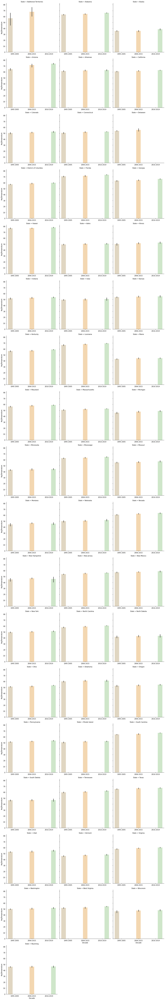

In [190]:
colors=['#EC6B56','#47B39C','#FFC154']
g = sns.catplot(x="Decade", y="AvgTemperature",
                  col="State",kind='bar',hue='Decade',col_wrap=3,palette="Pastel1_r",sharex=False,
                 data=USA_decade_avg,legend_out=True)


In [39]:
USA_trends=pd.DataFrame(USA_decade.groupby(['Decade','Year'])['AvgTemperature'].mean())
USA_trends=USA_trends.reset_index()


In [75]:
USA_trends

,Decade,Year,AvgTemperature
0,1995-2005,1995,54.976945
1,1995-2005,1996,49.768326
2,1995-2005,1997,53.946953
3,1995-2005,1998,54.586838
4,1995-2005,1999,55.237363
5,1995-2005,2000,54.468024
6,1995-2005,2001,55.394920
7,1995-2005,2002,53.290821
8,1995-2005,2003,54.439130
9,1995-2005,2004,54.898930


In [92]:
fig = px.scatter(USA_trends, x="Year", y="AvgTemperature", size="AvgTemperature", color="Decade",
            log_x=True, size_max=60)
fig.show()

In [87]:
import plotly.express as px
fig = px.line(USA_trends, x="Year", y="AvgTemperature", line_group="Decade",color="Decade",
           hover_name="Year", log_x=True)
fig.show()

## Assertion that 2012 is the most warmest year recorded  worldwide.

Lets check if this theory is applicable for USA data too. For this visualisation i have taken years of 2010,2011,2012,2013,2014 USA data (Average tenperature yearwise) categorised according to states and plotted using ploly scatter plot.

In [110]:
import plotly.express as px

px.scatter(USA_decade_avg.query("Year.isin([2010,2011,2012,2013,2014])"), x="State", y="AvgTemperature", animation_frame="Year",
           size="AvgTemperature", color="State",
            size_max=45, range_y=[25,90])


In [122]:
avg_temp_decade=pd.DataFrame(USA_trends.groupby('Decade')['AvgTemperature'].mean())
avg_temp_decade=avg_temp_decade.reset_index()
avg_temp_decade

,Decade,AvgTemperature
0,1995-2005,54.212375
1,2006-2015,55.514539
2,2016-2019,56.307904


In [140]:
fig = px.box(avg_temp_decade,y='AvgTemperature',x='Decade',color='Decade')
fig.show()

In [120]:
fig = px.scatter(USA_trends, x="Year", y="AvgTemperature", size="AvgTemperature", color="Year",
            log_x=True, size_max=60)
py.iplot()

## Training the Dataset and predicting

We are goig to predict the temperature based on **State,Day,Month** of the Year. For this purpse i am going to Divide the  data as  following

* **Training Data** as Data before the year 2015
* **Validation Data** as Data from year 2015 to 2019
* **Test Data** as Data to be predicted 5 months of year 2020

we are opting to use Gradient Boosting algorithm as well as Random forest Regressor ( though this is classification model but the output is not of interger datatype and hence we rule out Random forest classification algorithm)

We are going to visualise the bias by plotting actual data VS Predicted data and decide which algorithm fits better.

# Preparing data for a prediction

In [41]:


X=USA.copy()
Y=USA.AvgTemperature


X_train = X[(X.Year < 2015)].copy()
X_valid = X[(X.Year > 2014) & (X.Year != 2020)].copy()
X_test = X[(X.Year == 2020)].copy()

y_train = X_train.AvgTemperature
y_valid = X_valid.AvgTemperature
y_test = X_test.AvgTemperature

X_train.drop(['AvgTemperature'], axis=1, inplace=True)
X_valid.drop(['AvgTemperature'], axis=1, inplace=True)
X_test.drop(['AvgTemperature'], axis=1, inplace=True)


In [42]:
X_train.drop(['Region'], axis=1, inplace=True)
X_valid.drop(['Region'], axis=1, inplace=True)
X_test.drop(['Region'], axis=1, inplace=True)
X_train.drop(['Country'], axis=1, inplace=True)
X_valid.drop(['Country'], axis=1, inplace=True)
X_test.drop(['Country'], axis=1, inplace=True)


In [43]:
X_train.drop(['Year'], axis=1, inplace=True)
X_valid.drop(['Year'], axis=1, inplace=True)
X_test.drop(['Year'], axis=1, inplace=True)

In [44]:
X_train.dtypes

State    object
City     object
Month     int64
Day       int64
dtype: object

In [45]:
from sklearn.preprocessing import LabelEncoder

# Get list of categorical variables
s = (X_train.dtypes == 'object')
object_cols = list(s[s].index)

label_X_train = X_train.copy()
label_X_valid = X_valid.copy()
label_X_test = X_test.copy()

label_encoder = LabelEncoder()
for col in object_cols:
    label_X_train[col] = label_encoder.fit_transform(X_train[col])
    label_X_valid[col] = label_encoder.transform(X_valid[col])
    label_X_test[col] = label_encoder.transform(X_test[col])

In [46]:
label_X_train.head()

,State,City,Month,Day
1450990,1,14,1,1
1450991,1,14,1,2
1450992,1,14,1,3
1450993,1,14,1,4
1450994,1,14,1,5


In [47]:
#Training and testing the data

from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

model = XGBRegressor(n_estimators=1000,learning_rate=0.05,n_jobs=-1)
model.fit(label_X_train,y_train, early_stopping_rounds=5, eval_set=[(label_X_valid,y_valid)])
predictions = model.predict(label_X_test)
mae = mean_absolute_error(predictions,y_test)
print("Mean Absolute Error:" , mae)

[0]	validation_0-rmse:57.33844
Will train until validation_0-rmse hasn't improved in 5 rounds.
[1]	validation_0-rmse:54.66120
[2]	validation_0-rmse:52.12282
[3]	validation_0-rmse:49.71640
[4]	validation_0-rmse:47.43653
[5]	validation_0-rmse:45.27692
[6]	validation_0-rmse:43.22905
[7]	validation_0-rmse:41.28908
[8]	validation_0-rmse:39.45409
[9]	validation_0-rmse:37.71524
[10]	validation_0-rmse:36.07015
[11]	validation_0-rmse:34.51475
[12]	validation_0-rmse:33.04052
[13]	validation_0-rmse:31.65047
[14]	validation_0-rmse:30.33521
[15]	validation_0-rmse:29.09263
[16]	validation_0-rmse:27.91811
[17]	validation_0-rmse:26.80913
[18]	validation_0-rmse:25.76268
[19]	validation_0-rmse:24.77669
[20]	validation_0-rmse:23.85008
[21]	validation_0-rmse:22.97323
[22]	validation_0-rmse:22.14635
[23]	validation_0-rmse:21.37124
[24]	validation_0-rmse:20.63888
[25]	validation_0-rmse:19.95136
[26]	validation_0-rmse:19.30569
[27]	validation_0-rmse:18.69441
[28]	validation_0-rmse:18.12260
[29]	validation_0-

[256]	validation_0-rmse:8.63103
[257]	validation_0-rmse:8.63083
[258]	validation_0-rmse:8.62989
[259]	validation_0-rmse:8.62790
[260]	validation_0-rmse:8.62731
[261]	validation_0-rmse:8.62467
[262]	validation_0-rmse:8.62290
[263]	validation_0-rmse:8.62220
[264]	validation_0-rmse:8.62213
[265]	validation_0-rmse:8.61981
[266]	validation_0-rmse:8.61908
[267]	validation_0-rmse:8.61845
[268]	validation_0-rmse:8.61747
[269]	validation_0-rmse:8.61754
[270]	validation_0-rmse:8.61662
[271]	validation_0-rmse:8.61634
[272]	validation_0-rmse:8.61538
[273]	validation_0-rmse:8.61481
[274]	validation_0-rmse:8.61433
[275]	validation_0-rmse:8.61257
[276]	validation_0-rmse:8.61043
[277]	validation_0-rmse:8.60964
[278]	validation_0-rmse:8.60880
[279]	validation_0-rmse:8.60867
[280]	validation_0-rmse:8.60802
[281]	validation_0-rmse:8.60831
[282]	validation_0-rmse:8.60788
[283]	validation_0-rmse:8.60591
[284]	validation_0-rmse:8.60488
[285]	validation_0-rmse:8.60333
[286]	validation_0-rmse:8.60251
[287]	va

# Training and Predicting test data using Gradient Booster Algorithm

In [48]:
#model = XGBRegressor(n_estimators=1000,learning_rate=0.05,n_jobs=-1)
#model.fit(label_X_train,y_train, early_stopping_rounds=5, eval_set=[(label_X_valid,y_valid)])
#predictions = model.predict(label_X_test)
r2score = r2_score(predictions,y_test)
print("r2score:" , r2score)

r2score: 0.5892920776126662


In [49]:
predict=pd.DataFrame(predictions)
predict

,0
0,47.161060
1,46.778393
2,44.220200
3,44.220200
4,44.454708
...,...
20496,50.327942
20497,50.431225
20498,50.371323
20499,50.291885


In [50]:
test=pd.DataFrame(y_test)
test=test.reset_index()
test.drop('index',axis=1,inplace=True)
test

,AvgTemperature
0,44.4
1,51.3
2,60.4
3,54.6
4,40.9
...,...
20496,42.3
20497,43.1
20498,37.8
20499,41.9


In [51]:
print(X_test.count())
print(test.count())
print(y_test.count())

State    20501
City     20501
Month    20501
Day      20501
dtype: int64
AvgTemperature    20501
dtype: int64
20501


In [52]:
X_test=X_test.reset_index()
X_test.drop('index',axis=1,inplace=True)
X_test

,State,City,Month,Day
0,Alabama,Birmingham,1,1
1,Alabama,Birmingham,1,2
2,Alabama,Birmingham,1,3
3,Alabama,Birmingham,1,4
4,Alabama,Birmingham,1,5
...,...,...,...,...
20496,Wyoming,Cheyenne,5,9
20497,Wyoming,Cheyenne,5,10
20498,Wyoming,Cheyenne,5,11
20499,Wyoming,Cheyenne,5,12


In [53]:
predicted=pd.concat([X_test,test],axis=1,join='outer',ignore_index=False)

In [54]:
predicted.rename(columns={'AvgTemperature':'Actual'},inplace=True)

In [55]:
predicted=pd.concat([predicted,predict],axis=1,join='outer',ignore_index=False)

In [56]:
predicted.dtypes
predicted.rename(columns={0:'Predicted'},inplace=True)
predicted['Date']=predicted['Day'].map(str)+'/'+predicted['Month'].map(str)+'/'+'2020'
predicted['Date'] = pd.to_datetime(predicted['Date'])

In [57]:
predicted

,State,City,Month,Day,Actual,Predicted,Date
0,Alabama,Birmingham,1,1,44.4,47.161060,2020-01-01
1,Alabama,Birmingham,1,2,51.3,46.778393,2020-02-01
2,Alabama,Birmingham,1,3,60.4,44.220200,2020-03-01
3,Alabama,Birmingham,1,4,54.6,44.220200,2020-04-01
4,Alabama,Birmingham,1,5,40.9,44.454708,2020-05-01
...,...,...,...,...,...,...,...
20496,Wyoming,Cheyenne,5,9,42.3,50.327942,2020-09-05
20497,Wyoming,Cheyenne,5,10,43.1,50.431225,2020-10-05
20498,Wyoming,Cheyenne,5,11,37.8,50.371323,2020-11-05
20499,Wyoming,Cheyenne,5,12,41.9,50.291885,2020-12-05


# Actual Recorded VS Predicted temperature of year 2020 (USA Region)

Text(0.5, 1.0, 'Actual VS predicted temperature of USA 2020')

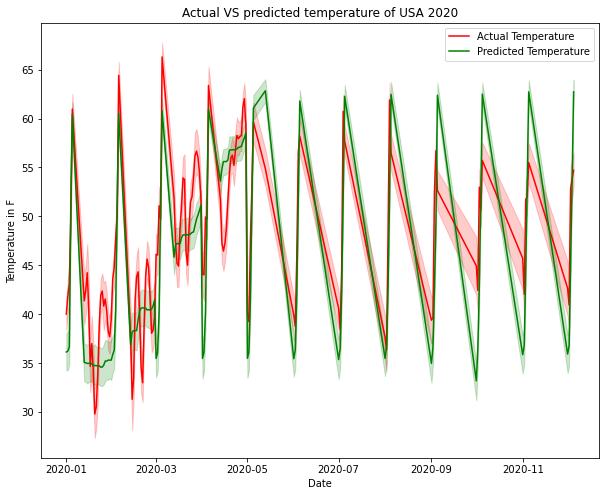

In [58]:
plt.figure(figsize= (10,8))
ax1 = sns.lineplot(x = 'Date', y = 'Actual',data = predicted,color='r',label='Actual Temperature')
ax2= sns.lineplot(x = 'Date', y = 'Predicted',data = predicted,color='g',label='Predicted Temperature')
plt.xlabel("Date")
plt.ylabel("Temperature in F")
plt.title("Actual VS predicted temperature of USA 2020")


# Training and Predicting test data using Random Forest Regressor Algorithm

In [59]:
from sklearn.ensemble import RandomForestRegressor 

In [60]:
model1=RandomForestRegressor(n_estimators=100,criterion="mse", max_depth=2, random_state=0)
model1.fit(label_X_train,y_train)
rfprediction=model1.predict(label_X_test)
maerf = mean_absolute_error(rfprediction,y_test)
print("Mean Absolute Error random forest:" , maerf)
r2scorerf=r2_score(rfprediction,y_test)
print("R 2 Score random forest:" , r2scorerf)


Mean Absolute Error random forest: 12.409811789547964
R 2 Score random forest: -0.503768777282326


In [62]:
predictrf=pd.DataFrame(rfprediction)
predictrf

,0
0,47.963614
1,47.963614
2,47.963614
3,47.963614
4,47.963614
...,...
20496,66.605333
20497,66.605333
20498,66.605333
20499,66.605333


In [66]:
predicted=pd.concat([predicted,predictrf],axis=1,join='outer',ignore_index=False)
predicted.rename(columns={0:'Predicted RF'},inplace=True)

In [67]:
predicted

,State,City,Month,Day,Actual,Predicted,Date,Predicted RF
0,Alabama,Birmingham,1,1,44.4,47.161060,2020-01-01,47.963614
1,Alabama,Birmingham,1,2,51.3,46.778393,2020-02-01,47.963614
2,Alabama,Birmingham,1,3,60.4,44.220200,2020-03-01,47.963614
3,Alabama,Birmingham,1,4,54.6,44.220200,2020-04-01,47.963614
4,Alabama,Birmingham,1,5,40.9,44.454708,2020-05-01,47.963614
...,...,...,...,...,...,...,...,...
20496,Wyoming,Cheyenne,5,9,42.3,50.327942,2020-09-05,66.605333
20497,Wyoming,Cheyenne,5,10,43.1,50.431225,2020-10-05,66.605333
20498,Wyoming,Cheyenne,5,11,37.8,50.371323,2020-11-05,66.605333
20499,Wyoming,Cheyenne,5,12,41.9,50.291885,2020-12-05,66.605333


# Plotting Actual vs Predicted(Gradient boosting) vs Predicted(Random forest regressor)

Text(0.5, 1.0, 'Actual VS predicted temperature of USA 2020')

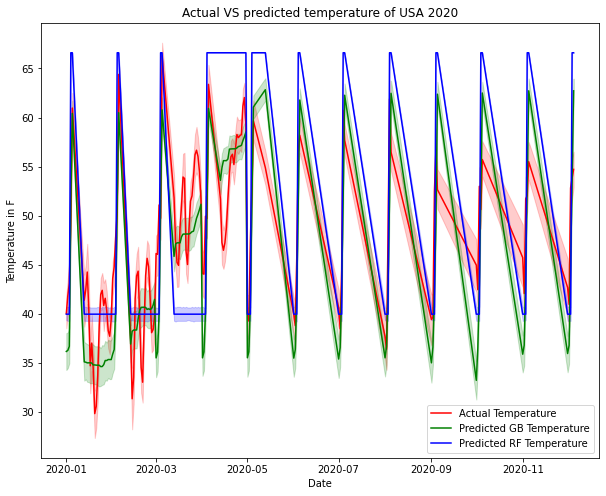

In [68]:
plt.figure(figsize= (10,8))
ax1 = sns.lineplot(x = 'Date', y = 'Actual',data = predicted,color='r',label='Actual Temperature')
ax2= sns.lineplot(x = 'Date', y = 'Predicted',data = predicted,color='g',label='Predicted GB Temperature')
ax3= sns.lineplot(x = 'Date', y = 'Predicted RF',data = predicted,color='b',label='Predicted RF Temperature')
plt.xlabel("Date")
plt.ylabel("Temperature in F")
plt.title("Actual VS predicted temperature of USA 2020")

# Conclusion of this Analysis

#### The North,West and Alaska have seen most temperature increase while southwestern and Alaska remains with least temperature change
* This claims have proven to be true so far from our analysis the extremties of the temperature in these regions also has significant differences

* Also while looking at the time series data of states in chloropleth maps the color variations are significant in the north and eastern parts

* There is very minimal to No change in temperature in the South eastern Parts of USA  and Alaska

#### 2006-2015 was the warmest decade on record worldwide , is it True for USA too?
* While looking up closely at the data by categorizing into 3 decades , it is partially true and this effect is not that much significant in many states.

* If looking at the  Average of temperatures recorded for that decade statewise we can conclude this is minimally visible in few states

* But if observing for whole of USA ,categorizing decade wise , yes this stands out true to the claim.

#### 2012 was the warmest year recorded worldwide,then what about USA?

* This allegation claims to be so far true according our data while looking at the nearest years ie 2010,2011 (prior years) and 2013,2014 (later years) where this representaion is clearly felt statewise.

* looking at the time series data of whole of USA also these facts are inline with our analysis.Also this pattern is significantly seen in North and western part of USA while South eastern and Alaska are not very much affected which again proves our point number 2

#### 2012 and 2015 are warmest years.

* while statewise this effect is true with 2012 ,the case of 2015 cannot be still considered as "warmest year" because its effect are scattered and not prominent in many states

#### Average temperature increases by 0.4 F for every decade

* The observed differences in the classified decade are about **1.05 F increase per decade**.
* Which is **0.65 F** more than the claimed temperature increase of **0.4 F** per decade.
* This might be accounted to the fact that we only have data from 1995 - 2020 ,so we can roughtly divide them into 3 decades.
* Also the third decade becomes insignificant in this analysis since its still an ongoing decade


# Prediction and Improvement points:

* The r2 score of gradient boosting algorithm is close to 0.6 while r2 score of random forest regressor is in negative , 
  so i conclude that gradient boosting algorithm is best for building up the model and prediction.
  
* The prediction and analysis can be improved by feeding more years of data ,say from 1970's so that the accuracy of prediction 
  and deeper analsyis can be acheived.

* The prediction of Temperature can also be improved by collecting parameters of distance from the waterbodies,altitude,latitude position,ocean currents,humidity,cloud cover.
